# Colorizing B&W Photos

In this notebook, we will look into re-colorizing images from their grayscale versions. Gray images can only supply our model shapes and textures, all colors need to be predicted from the recognition of those features. Our task is to find an architecture capable of finding relationships between patterns, textures in the photo and the possible colors appropriate for them.

Useful documentation: https://www.kaggle.com/code/abhishekgautam12/image-colorization-encoder-decoder-incepresv2
This project is also similar to the approach found here: https://arxiv.org/pdf/1712.03400.pdf #Actually read this paper on dec the 8th
It must be said, the examples of prediction from this paper look very much like what we have been getting.

> **Importing useful Modules**

In [ ]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import keras.backend as K
import cv2
from IPython.display import clear_output
from keras.losses import mean_squared_error
from skimage.color import rgb2gray, rgb2lab, lab2rgb #gray2rgb
from sklearn.model_selection import train_test_split
from tensorflow.image import resize
from tensorflow.keras import layers
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, Callback
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, RepeatVector, Add
from tensorflow.keras.layers import Reshape, concatenate
from tensorflow.keras.models import Model, save_model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img, Sequence
from tensorflow.keras.utils import plot_model
from tqdm import tqdm

> **Importing Training Images**

Our model will use two inputs, the first being a 400 by 400 image consisting of a single dimension L (Light). The other input in our model was taken from the example at: https://www.kaggle.com/code/abhishekgautam12/image-colorization-encoder-decoder-incepresv2. The original writers incorporated the InceptionResNetV2 (from tensorflow.keras.applications) to create a 1000-float-long embedding of the gray photo. This inception model needs an input shaped like 299,299,3, for that reason, we need to duplicate the L dimension to provide a gray image in RGB format to the inception model.

In the following code, we can provide a grayscale 400,400,1 photo and get the embedding back. We have found that generating the embedding before giving the 2 inputs to the model can be slow. For that reason, the create_inception_embedding_single has the parameter return_embed which grants us the option to generate the embedding later, straight within the training of the model, which is faster.

The boolean pre_embed is used to change select parts of the model's architecture. While troubleshooting why sometimes the same model would give out gray output and sometimes colored output, we looked into whether pre-embedding or not the photos make a difference.

In [ ]:
#Create embedding
pre_embed = False

inception = InceptionResNetV2(include_top=True)
def gray2rgb(pix):
    return np.concatenate([pix, pix, pix], axis=-1)


def create_inception_embedding_single(grayscale, return_embed = pre_embed):
    three_channeled_L = gray2rgb(grayscale)
    three_channeled_L = resize(three_channeled_L, (299, 299)) #size for inception model #https://blog.floydhub.com/colorizing-b-w-photos-with-neural-networks/


    if return_embed:
        grayscaled_resized = np.expand_dims(np.array(three_channeled_L).astype(np.uint8), axis=0)
        embed = inception.predict(grayscaled_resized)
        embed = np.squeeze(embed, axis=0)
        return embed
    return three_channeled_L #Leaving the emmbeding generation to our model later. Providing the gray image in the correct format for the inception model.

While tuning our model, we ran input many OOM errors. This was due to too large batch sizes and too large datasets loaded at once. To resolve those issues, we made this custom data generator. This object loops through our dataset folder returning a batch_sized subset for each epoch. Once all data in the dataset was given to the model for training, the generator loops back to the beginning of the folder providing the same training data over and over until the model is done training.

This data generator also has some data augmentation implemented within.

In [ ]:
class CustomDataGenerator(Sequence):
    def __init__(self, path_to_rgb, total_images, batch_size=10, start=0):
        self.path_to_rgb = path_to_rgb #Where we have our dataset
        self.total_images = total_images #Needs to know how many photos we have
        self.batch_size = batch_size
        self.photo_names = [f for f in os.listdir(self.path_to_rgb) if f.endswith('.jpg')]
        self.indexes = np.arange(len(self.photo_names))
        self.counter = start
        self.loop_count = 0

        self.datagen = ImageDataGenerator(
            rotation_range=3,
            width_shift_range=0.01,
            height_shift_range=0.01,
            # zoom_range=0.1,
            horizontal_flip=True,
            fill_mode='nearest'
        )

    def __len__(self):
        return 1000000 #Give the illusion we have plenty of samples to the .fit function

    def __getitem__(self, index):
        cv2.destroyAllWindows() # .fit crash: zmq.error.ZMQError: Too many open files after thousands of epochs. Rabbit hole: This error occurred at 2300 epochs, multiple times. This is about 2 sec per epoch step * 10 step is 20s per epoch is 766 minutes or about 12h :'( History variable does not get assigned. This line oes not even fix the issue
        index_n = 0
        index_n += self.counter
        self.counter += 1

        if ((self.counter+2) * self.batch_size > self.total_images): #If we are close to the end of the dataset
            self.counter = 2
            index_n = self.counter
            self.loop_count += 1

        #Time to make the batch
        start = index_n * self.batch_size
        end = (index_n + 1) * self.batch_size
        batch_paths = self.photo_names[start:end]

        l_array = []
        ab_array = []
        embed_array = []

        desc = f"Processing {start}-{end}    loop count: {self.loop_count}"
        print(f" {desc}")

        for photo_name in batch_paths:#tqdm(batch_paths, desc=desc):
            photo_path = os.path.join(self.path_to_rgb, photo_name)
            rgb_image = cv2.imread(photo_path) #<- Get BGR image
            rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2BGR) #<- Transform to RGB (RGB2BGR is supposed to be the same as BGR2RGB, here only this worked)
            resized_image = cv2.resize(rgb_image, (400, 400))

            resized_image = self.datagen.random_transform(resized_image)


            lab_image = cv2.cvtColor(resized_image, cv2.COLOR_RGB2LAB)
            l_channel = lab_image[:, :, 0]
            ab_channels = lab_image[:, :, 1:]
            l_channel = np.expand_dims(l_channel, axis=-1)

            l_array.append(l_channel)
            ab_array.append(ab_channels)
            # print(f"Before embedding: {l_channel.shape}")

            embed = create_inception_embedding_single(l_channel) #Giving 400,400,1 and looking to get 299,299,3 where 3 is l,l,l
            embed_array.append(embed)



        return ((np.array(l_array)*(1/255), np.array(embed_array)), np.array(ab_array)*(1/255)) #returned scaled

In this project, we have tried 4 datasets. The first one is the class-provided dataset for this assignment, which is not here as its format was different than all other datasets we have used.

The next dataset here is the Outdoors dataset. Turns out that there are lots of buildings, streets, alleys and other 'outside' photos that are not the 'nature' photos we had hoped for.
The 2nd dataset here is the fairface dataset. Many photos in this dataset are not ideal, bad lighting, heavily cropped photos and sometimes poor resolution. Our model was able to recognize some faint skin color tones on a few testing samples.
The last dataset is a Pokemon dataset. I was hoping to find different reactions from the model when giving it clear patterns from each Pokemon with a smaller dataset. Not great results were accomplished here either.

Here we will be initializing our train, val and test data. Both the test and train data will be supplied through the same train_dataset dataset object. We will use the first few batches for the test data and never load them again while training. To avoid reloading those test samples when looping over the whole dataset, the counter is not reinitialized to 0 but rather 5, skipping the first few.

The validation data has been a head hack. It is needed to utilize the ReduceLROnPlateau. At first, we loaded another batch from the original train_dataset. Staking those batches into a single one was an error generator. Instead, we made a whole other dataset object with a different batch size. Bad validation data leads to gray predictions, very hard to troubleshoot.

In [ ]:
dataset = 0

if (dataset == 0):
    # Found at https://mmlab.ie.cuhk.edu.hk/projects/SFTGAN/ on 11/30/23
    path_to_rgb = 'C:/Users/CharlesBnf/Documents/CSUMB/cst463/final/OutdoorSeg_img/images'
    total_images = 2500#9900
    batch_size = 10
elif (dataset == 1):
    #Found at https://github.com/joojs/fairface using the 1.25 padding on 12/4/23
    path_to_rgb = 'C:/Users/CharlesBnf/Documents/CSUMB/cst463/final/fairface-img-margin125-trainval/train'
    total_images = 86744
    batch_size = 200
elif (dataset == 2):
    #https://www.kaggle.com/datasets/kvpratama/pokemon-images-dataset/        pokemon dataset downloaded on 12/7/23
    #maybe too little of a dataset, each pokemon only showing up once. Even with data augmentation, this did not perform well.
    path_to_rgb = 'C:/Users/CharlesBnf/Documents/CSUMB/cst463/final/archive/pokemon_jpg/pokemon_jpg'
    total_images = 819
    batch_size = 10


# Create a custom data generator
data_generator = CustomDataGenerator(path_to_rgb=path_to_rgb, total_images=total_images, batch_size=batch_size)


# Create a tf.data.Dataset from the generator
if pre_embed:
    train_dataset = tf.data.Dataset.from_generator(
        lambda: data_generator,
        output_signature=(
            (
                tf.TensorSpec(shape=(None, 400, 400, 1), dtype=tf.float32),
                tf.TensorSpec(shape=(None, 1000,), dtype=tf.float32)
            ),
            tf.TensorSpec(shape=(None, 400, 400, 2), dtype=tf.float32)
        )
    )
else:
    train_dataset = tf.data.Dataset.from_generator(
        lambda: data_generator,
        output_signature=(
            (
                tf.TensorSpec(shape=(None, 400, 400, 1), dtype=tf.float32),
                tf.TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32)
            ),
            tf.TensorSpec(shape=(None, 400, 400, 2), dtype=tf.float32)
        )
    )

sample_samples = [[[],[]],[]]
total_test_batchs = 1
count = 1
for batch in train_dataset: #<- used for testing, samples never seen/never to be seen by our model when training.
    if (count > total_test_batchs):
        break
    count +=1
    # print(batch[0][0].shape)
    # print(batch[0][1].shape)
    sample_samples[0][0].extend(batch[0][0])
    sample_samples[0][1].extend(batch[0][1])
    sample_samples[1].extend(batch[1])



data_generator_val = CustomDataGenerator(path_to_rgb=path_to_rgb, total_images=total_images, batch_size=200, start=2) #Start leaves first 50 samples of test out of val data and train data. No test data leakage.

if pre_embed:
    val_dataset = tf.data.Dataset.from_generator(
        lambda: data_generator_val,
        output_signature=(
            (
                tf.TensorSpec(shape=(None, 400, 400, 1), dtype=tf.float32),
                tf.TensorSpec(shape=(None, 1000,), dtype=tf.float32)
            ),
            tf.TensorSpec(shape=(None, 400, 400, 2), dtype=tf.float32)
        )
    )
else:
    val_dataset = tf.data.Dataset.from_generator(
    lambda: data_generator_val,
    output_signature=(
        (
            tf.TensorSpec(shape=(None, 400, 400, 1), dtype=tf.float32),
            tf.TensorSpec(shape=(None, 299, 299, 3), dtype=tf.float32)
        ),
        tf.TensorSpec(shape=(None, 400, 400, 2), dtype=tf.float32)
    )
)

for batch in val_dataset:
    X_val = batch
    break

#Other working way to setup X_val
# X_val = ([], [])  # Using lists instead of tuples
# Y_val = []

# total_val_batches = 20
# count = 1

# for batch in train_dataset:
#     if count > total_val_batches:
#         break

#     count += 1
#     X_val[0].extend(batch[0][0].numpy())
#     X_val[1].extend(batch[0][1].numpy())
#     Y_val.extend(batch[1].numpy())


# X_val = (np.array(X_val[0]), np.array(X_val[1]))
# Y_val = np.array(Y_val)



 Processing 0-10    loop count: 0
 Processing 10-20    loop count: 0
 Processing 400-600    loop count: 0


In [ ]:
# print("X_val[0] shape:", X_val[0].shape)
# print("X_val[1] shape:", X_val[1].shape)
# print("Y_val shape:", Y_val.shape)

print("X_val[0][0] shape:", X_val[0][0][0].shape)
print("X_val[0][1] shape:", X_val[0][1][0].shape)
print("X_val[1] shape:", X_val[1][0].shape)

X_val[0][0] shape: (400, 400, 1)
X_val[0][1] shape: (299, 299, 3)
X_val[1] shape: (400, 400, 2)


Checking out some sample data: We can visually notice the data augmentation for the first time. Despite the data generator looping over the same data, the data augmentation is made to be different every time the photos are reloaded.

(400, 400, 3)


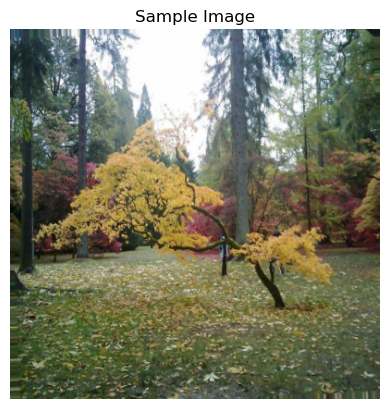

(299, 299, 3)


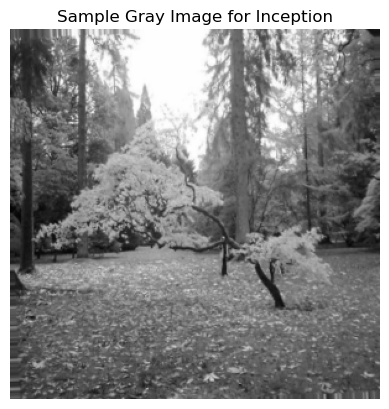

In [ ]:
sample = 4
#Test photo
sample_lab = np.concatenate((sample_samples[0][0][sample]*255, sample_samples[1][sample]*255), axis=-1)
print(sample_lab.shape)
sample_rgb = cv2.cvtColor(sample_lab.astype(np.uint8), cv2.COLOR_LAB2RGB)

plt.imshow(sample_rgb)
plt.title('Sample Image')
plt.axis('off')
plt.show()

if not pre_embed:
    sample_lll = np.array(sample_samples[0][1][sample]).astype(np.uint8)
    print(sample_lll.shape)

    plt.imshow(sample_lll)
    plt.title('Sample Gray Image for Inception')
    plt.axis('off')
    plt.show()

Let's build this model now. The encoder input takes the L photo and encodes it down to 50x50x512. The inception input takes the resized L photo, embeds it using the inception net into a single 1000-float -array-, makes 2500 copies of this embedding, and finally reshapes those into a 50x50x1000 layer.

Next we place those two 50x50 'images' onto one-another. This makes a new 50x50x1520 layer called fusion_output.

Lastly we reduce those 1520 dimentions back into the two colors a & b through Conv2DTranspose layers and one Conv2D layer.

Some thoughts after spending lots of time refining the model: Very minor changes can drastically impact the capabilities of this model, 99% of the time in a negative way. The model takes about 35-45 minutes to train through the 9500 images dataset 7-8 times. This is about when basic colors start to come out (yes blue sky and localized green grass). Sometimes we could tell early on 10-20 minutes in training that our changes were very bad when even the hue of very vegetative photos was still gray and not overall greenish. Amongst all the troubleshooting and feature implementation, we glossed over looking for ways to resize the image within the model. The trouble of making this work outside of the model was fine.

In [ ]:
encoder_input = Input(shape=(400, 400, 1,))
encoder_output = Conv2D(64, (3,3), activation='relu', padding='same', strides=2)(encoder_input)
encoder_output = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(128, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)


if pre_embed:
    embed_input = Input(shape=(1000,))
    embed_input_for_fusion = embed_input
else:
    embed_input = Input(shape=(299, 299, 3,))
    inception = InceptionResNetV2(include_top=True)(embed_input)
    inception.trainable = False
    embed_input_for_fusion = inception

fusion_output = RepeatVector(50 * 50)(embed_input_for_fusion)
fusion_output = Reshape(([50, 50, 1000]))(fusion_output)
fusion_output = concatenate([encoder_output, fusion_output], axis=3)

low_strd = 3 #The paper from arxiv.org sugested this number be 1. This did not work.
decoder_output = layers.Conv2DTranspose(512, low_strd, activation = 'relu', padding = 'same')(fusion_output)
decoder_output = layers.Conv2DTranspose(512, low_strd, activation = 'relu', padding = 'same', strides=2)(decoder_output)
decoder_output = layers.Conv2DTranspose(256, low_strd, activation = 'relu', padding = 'same')(decoder_output)
decoder_output = layers.Conv2DTranspose(128, low_strd, activation = 'relu', padding = 'same', strides=2)(decoder_output)
decoder_output = layers.Conv2DTranspose(64, low_strd, activation = 'relu', padding = 'same')(decoder_output)
decoder_output = layers.Conv2DTranspose(16, low_strd, activation = 'relu', padding = 'same', strides=2)(decoder_output)

decoder_output = Conv2D(2, 1, activation="linear", padding = 'same')(decoder_output)

model = Model(inputs=[encoder_input, embed_input], outputs=decoder_output)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 400, 400, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_203 (Conv2D)            (None, 200, 200, 64  640         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_204 (Conv2D)            (None, 200, 200, 12  73856       ['conv2d_203[0][0]']             
                                8)                                                            

Bellow are other attempts of models that compiled and were attempted to be trained. Most of the changes were done little by little. They do not perform any better.

In [ ]:
if False:
    encoder_input = Input(shape=(400, 400, 1,))
    encoder_output = Conv2D(64, (3,3), activation='relu', padding='same', strides=2)(encoder_input)
    encoder_output = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_output)

    encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)

    encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
    encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
    encoder_output = Conv2D(512, (3,3), activation=None, padding='same', use_bias=False)(encoder_output)
    encoder_output = layers.BatchNormalization()(encoder_output)
    encoder_output = layers.Activation('relu')(encoder_output)
    encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
    encoder_output = Conv2D(1024, (3,3), activation='relu', padding='same')(encoder_output)

    inception_input = Input(shape=(299, 299, 3,))
    inception = InceptionResNetV2(include_top=True)(inception_input)  # Note the input_shape
    inception.trainable = False
    # print(inception)
    # Upsample the output of InceptionResNetV2 to match the shape of the encoder output



    #Embedding Input
    # embed_input = Input(shape=(1000,))
    embed_output = RepeatVector(50 * 50)(inception.output) #this makes 50*50:2500 vectors of length 1000 with the same 1000 embed values from input
    embed_output = Reshape(([50, 50, 1000]))(embed_output) #Reshaped to have indeed the correct 50,50,1000 shape

    small_embed = layers.SeparableConv2D(1024, 1, activation='relu', padding='same')(embed_output)
    small_embed = layers.SeparableConv2D(1024, 1, activation='relu', padding='same')(small_embed)
    small_embed = layers.SeparableConv2D(1024, 1, activation='relu', padding='same')(small_embed)
    small_embed = layers.SeparableConv2D(1024, 1, activation='relu', padding='same')(small_embed)
    s_embed_n_enc_out = layers.add([small_embed, encoder_output])

    #Mixing both inputs
    fusion = concatenate([encoder_output, embed_output], axis=3)

    #Concat 1
    fusion_output = Conv2D(720, (1, 1), activation='relu', padding='same')(fusion)
    fusion_output1 = Conv2D(1024, 1, activation='relu', padding='same')(fusion_output)
    fusion_output = Conv2D(720, (1, 1), activation='relu', padding='same')(fusion_output)
    fusion_output = Conv2D(1024, (1, 1), activation=None, padding='same', use_bias=False)(fusion_output)
    fusion_output = layers.BatchNormalization()(encoder_output)
    fusion_output2 = layers.Activation('relu')(encoder_output)

    fusion_output = Conv2D(512, (1, 1), activation='relu', padding='same')(fusion_output2)
    fusion_output = Conv2D(1024, (1, 1), activation='relu', padding='same')(fusion_output)
    add = layers.add([fusion_output1, fusion_output2, encoder_output])

    # residual_connection = Conv2D(720, (1, 1), activation='relu', padding='same')(encoder_output)
    # residual_connection = layers.BatchNormalization()(residual_connection)
    # residual_connection = layers.Activation('relu')(residual_connection)
    fusion_output = layers.add([fusion_output, s_embed_n_enc_out])
    #Concat 2
    # fusion_output_norm = Conv2D(512, (1, 1), activation=None, padding='same', use_bias=False)(concat)
    # fusion_output_norm = layers.BatchNormalization()(fusion_output_norm)
    # fusion_output_norm = layers.Activation('relu')(fusion_output_norm)

    #Concat 1 & 2
    fusion_output_mix = layers.add([fusion_output,add])

    #Decoding
    x = layers.Conv2DTranspose(512, 3, activation = 'relu', padding = 'same')(fusion_output)
    x = Conv2D(512, (3,3), activation='relu', padding='same')(x)
    x = Conv2D(512, (3,3), activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(512, 3, activation = 'relu', padding = 'same', strides=2)(x)

    x = Conv2D(256, (3,3), activation='relu', padding='same')(x)

    x = layers.Conv2DTranspose(256, 3, activation = 'relu', padding = 'same')(x)
    x = layers.Conv2DTranspose(128, 3, activation = 'relu', padding = 'same', strides=2)(x)

    x = layers.Conv2DTranspose(64, 3, activation = 'relu', padding = 'same')(x)
    x = layers.Conv2DTranspose(64, 3, activation = 'relu', padding = 'same', strides=2)(x)



    decoder_output = Conv2D(2, 1, activation="linear", padding = 'same')(x) #knok knok, how's here? the solution! ahaha

    model = Model(inputs=[encoder_input, embed_input], outputs=decoder_output)

In [ ]:
if False:
    #L Image Encoder
    encoder_input = Input(shape=(400, 400, 1,))
    encoder_output = Conv2D(128, (3,3), activation='relu', padding='same', strides=2)(encoder_input)
    encoder_output = Conv2D(128, (3,3), activation='relu', padding='same')(encoder_output)
    # encoder_output = layers.BatchNormalization()(encoder_output)
    # encoder_output = layers.Activation('relu')(encoder_output)
    encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)

    encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
    encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
    encoder_output = Conv2D(512, (3,3), activation=None, padding='same', use_bias=False)(encoder_output)
    encoder_output = layers.BatchNormalization()(encoder_output)
    encoder_output = layers.Activation('relu')(encoder_output)
    encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
    encoder_output = Conv2D(1024, (3,3), activation='relu', padding='same')(encoder_output)


    inception_input = Input(shape=(299, 299, 3,))
    inception = InceptionResNetV2(include_top=True)(inception_input)  # Note the input_shape
    inception.trainable = False
    # print(inception)
    # Upsample the output of InceptionResNetV2 to match the shape of the encoder output
    # upsample_inception = layers.Conv2DTranspose(512, (3, 3), activation='relu', padding='valid', strides=(2, 2))(inception.output)
    # upsample_inception = layers.UpSampling2D(size=(3, 3))(upsample_inception)
    #Embedding Input
    # embed_input = Input(shape=(1000,))
    embed_output = RepeatVector(50 * 50)(inception) #this makes 50*50:2500 vectors of length 1000 with the same 1000 embed values from input
    embed_output = Reshape(([50, 50, 1000]))(embed_output) #Reshaped to have indeed the correct 50,50,1000 shape

    #Mixing both inputs
    concat = concatenate([encoder_output, embed_output], axis=3) #adding the bedding with encoder output, will test layers.add instead of concatenate

    #Concat 1
    fusion_output = Conv2D(720, (1, 1), activation='relu', padding='same')(concat)
    fusion_output1 = Conv2D(1024, 1, activation='relu', padding='same')(fusion_output)
    fusion_output = Conv2D(720, (1, 1), activation='relu', padding='same')(fusion_output)
    fusion_output = Conv2D(1024, (1, 1), activation=None, padding='same', use_bias=False)(fusion_output)
    fusion_output = layers.BatchNormalization()(encoder_output)
    fusion_output2 = layers.Activation('relu')(encoder_output)

    fusion_output = Conv2D(512, (1, 1), activation='relu', padding='same')(fusion_output2)
    fusion_output = Conv2D(1024, (1, 1), activation='relu', padding='same')(fusion_output)
    add = layers.add([fusion_output1, fusion_output2, encoder_output])
    #Concat 2
    # fusion_output_norm = Conv2D(512, (1, 1), activation=None, padding='same', use_bias=False)(concat)
    # fusion_output_norm = layers.BatchNormalization()(fusion_output_norm)
    # fusion_output_norm = layers.Activation('relu')(fusion_output_norm)

    #Concat 1 & 2
    fusion_output_mix = layers.add([fusion_output,add])

    #Decoding
    x = layers.Conv2DTranspose(512, 3, activation = 'relu', padding = 'same')(fusion_output_mix)
    x = Conv2D(512, (3,3), activation='relu', padding='same')(x)
    x = Conv2D(512, (3,3), activation='relu', padding='same')(x)
    x = layers.Conv2DTranspose(512, 3, activation = 'relu', padding = 'same', strides=2)(x)

    x = Conv2D(256, (3,3), activation='relu', padding='same')(x)

    x = layers.Conv2DTranspose(256, 3, activation = 'relu', padding = 'same')(x)
    x = layers.Conv2DTranspose(128, 3, activation = 'relu', padding = 'same', strides=2)(x)

    x = layers.Conv2DTranspose(64, 3, activation = 'relu', padding = 'same')(x)
    x = layers.Conv2DTranspose(64, 3, activation = 'relu', padding = 'same', strides=2)(x)


    decoder_output = Conv2D(2, 1, activation="linear", padding = 'same')(x) #knok knok, how's here? the solution! ahaha

    model = Model(inputs=[encoder_input, inception_input], outputs=decoder_output)

> **Training the Model**

Before we train the model, let's double check the shapes of all predictor and target variables.

In [ ]:
print("batch shape:", len(sample_samples[0]))
print("batch_L shape:", len(sample_samples[0][0])) #L : X_train
print("batch_embed shape:", len(sample_samples[0][1])) #L: resized
print("Y shape:", len(sample_samples[1])) # target: a & b

batch shape: 2
batch_L shape: 10
batch_embed shape: 10
Y shape: 10


Here is our custom callback that will print a sample image at the end of each epoch. We get to see the progress of our model in real-time. This callback also will store some information regarding the range of predicted values into this array called mins_n_maxs so we can plot this with the History later. Other measures could have been more representative than mins and maxs like standard deviation. This was fast and and the plots are telling anyways.

Another feature that would have been nice in this callback would be to display the predicted colors on a flat white image rather than the L input. This could clearly show the colored spots generated from the model.

In [ ]:
mins_n_maxs = []
class DisplayTestResults(Callback):
    def __init__(self, dataset, model):
        self.dataset = dataset #Used to be X_train
        self.model = model

    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        batch = next(iter(self.dataset))
        index = np.random.randint(0, len(batch[1]))

        x_test_sample = (batch[0][0][index], batch[0][1][index])
        y_test_sample = batch[1][index]

        y_pred = self.model.predict((np.expand_dims(x_test_sample[0], axis=0), np.expand_dims(x_test_sample[1], axis=0)))

        print(f"Predicted a_max {y_pred[0,:,:,0].max().round(4)}, a_min {y_pred[0,:,:,0].min().round(4)}, a_mean {y_pred[0,:,:,0].mean().round(4)}, b_max {y_pred[0,:,:,1].max().round(4)}, b_min {y_pred[0,:,:,1].min().round(4)}, b_mean {y_pred[0,:,:,1].mean().round(4)}", flush=True)
        mins_n_maxs.append([[y_pred[0,:,:,0].max().round(4), y_pred[0,:,:,0].min().round(4), y_pred[0,:,:,0].min().round(4)],[y_pred[0,:,:,1].max().round(4), y_pred[0,:,:,1].min().round(4), y_pred[0,:,:,1].mean().round(4)]]) #Maybe to be plotted later with history.


        l_sample = batch[0][0][index]

        ab_sample = batch[1][index]
        img_pred =  np.zeros((ab_sample.shape[0], ab_sample.shape[1], 3), dtype=np.uint8)
        img_pred[:, :, 0] = l_sample[:,:,0] *255
        img_pred[:, :, 1:] = y_pred*255 #<- the magic right here
        img_rgb_pred = cv2.cvtColor(img_pred, cv2.COLOR_LAB2RGB)


        img_lab =  np.zeros((ab_sample.shape[0], ab_sample.shape[1], 3), dtype=np.uint8)
        img_lab[:, :, 0] = l_sample[:,:,0]*255 #L
        img_lab[:, :, 1:] = ab_sample*255
        img_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)



        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(batch[0][0][index][:, :, 0], cmap='gray')
        plt.title('Gray Scale Image')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(img_rgb_pred)
        plt.title('Predicted Image')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(img_rgb)
        plt.title('Correct Image')
        plt.axis('off')

        plt.show()

display_test_results_callback = DisplayTestResults(train_dataset, model)

Here are some custom loss functions. By removing the absolute distance from Gray "- K.abs(pred_a - 0.5)" we let the model know that colors are better predictions than gray.

In [ ]:
def lab_colorization_loss(y_true, y_pred):

    true_a = y_true[:, :, :, 0]
    true_b = y_true[:, :, :, 1]

    pred_a = y_pred[:, :, :, 0]
    pred_b = y_pred[:, :, :, 1]

    modified_a = K.abs(true_a - pred_a) * 10 - K.abs(pred_a - 0.5)
    modified_b = K.abs(true_b - pred_b) * 10 - K.abs(pred_b - 0.5)

    return (modified_a + modified_b)

Ideally, the loss function would have returned a loss value per pixel per channel a|b. It seems the .fit function applies the average of the returned loss data structure over the whole image. Below is an attempt to at least fit the model with two outputs a and b with two distinct loss values respectively. However, this meant renaming and changing the output architecture of our model.

In [ ]:
# def lab_colorization_loss_single(y_true, y_pred):
#     loss = K.abs(y_true - y_pred) * 10 - K.abs(y_pred - 0.5)
#     return loss

# patient = True


# if patient:
#     early_stopping = EarlyStopping(patience=2000, restore_best_weights=True, verbose=1)
#     reduce_LR = ReduceLROnPlateau(patience=150, min_lr = 0.0000001, verbose=1)
#     b_s = 10
#     epochs = 10000
# else:
#     early_stopping = EarlyStopping(patience=7, restore_best_weights=True, verbose=1)
#     reduce_LR = ReduceLROnPlateau(patience=4, min_lr = 0.00001, verbose=1)
#     b_s = 10
#     epochs = 40

# initial_learning_rate = 0.001
# optimizer = Adam(learning_rate=initial_learning_rate)

# model.compile(optimizer=optimizer,
#               loss={'output_a': lab_colorization_loss_single, 'output_b': lab_colorization_loss_single},
#               metrics={'output_a': 'mae', 'output_b': 'mae'})


# history = model.fit(
#     train_dataset,
#     validation_data=(
#         (X_val[0][0], X_val[0][1]),  # Separate the validation inputs
#         {'output_a': X_val[1][0], 'output_b': X_val[1][1]},  # Validation targets
#     ),
#     epochs=epochs,
#     batch_size=b_s,
#     steps_per_epoch=10,
#     callbacks=[early_stopping, reduce_LR, display_test_results_callback],
# )

Finally, we get to fit our model. Strangely while looking at the model train, there is this very straight 15-pixel wide blue line covering the top edge of some photos. This is noticed throughout different settings, sometimes dataset. Not entirely sure what causes this.

The image displaying callback has been critical to follow the impact of all tweaks on the model. While looking at the training rhythm over and over, we can notice a pattern.

First, the images will make no sense, all blue with sometimes red and yellow spots and circles. Within one epoch or two, this gets solved. Next appears grayer with all blue hues sometimes. Next and for a while, just gray, very lightly red earth brown. Then sheeps and zebras will be all green, this is a good sign, not always happening. This is due to their grassy surroundings that make an impact of the model, easy to recognize. From there, smaller and smaller bushes, clouds and little sneaky sky bits get recognized with the correct color. The buildings are hard, the dataset has many of them. It seems the model overall just averages the building tones.

 Processing 1550-1560    loop count: 0
Predicted a_max 0.5788999795913696, a_min 0.14470000565052032, a_mean 0.506600022315979, b_max 0.5396000146865845, b_min 0.10360000282526016, b_mean 0.4950000047683716


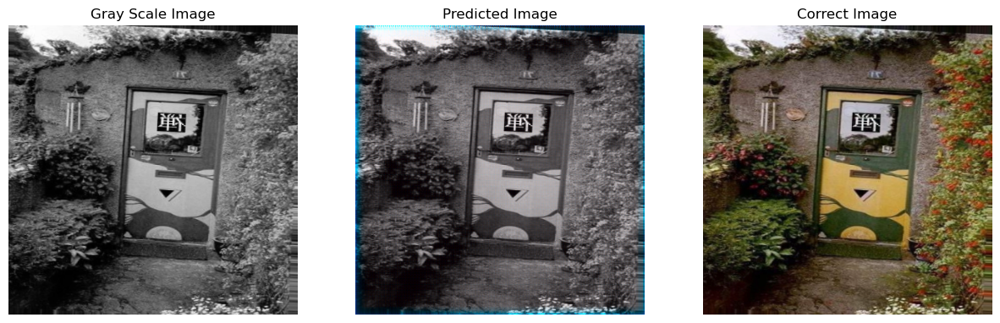

10/10 [==============================] - 8s 866ms/step - loss: 1.0036 - mae: 0.0532 - mse: 0.0054 - val_loss: 0.9412 - val_mae: 0.0489 - val_mse: 0.0048 - lr: 0.0010
Epoch 15/10000
 Processing 1560-1570    loop count: 0
 9/10 [==========================>...] - ETA: 0s - loss: 0.8796 - mae: 0.0465 - mse: 0.0043 Processing 1650-1660    loop count: 0


KeyboardInterrupt: 

In [ ]:
patient = True


if patient:
    early_stopping = EarlyStopping(patience=2000, restore_best_weights=True, verbose=1)
    reduce_LR = ReduceLROnPlateau(patience=150, min_lr = 0.0000001, verbose=1)
    b_s = 10
    epochs = 10000
else:
    early_stopping = EarlyStopping(patience=7, restore_best_weights=True, verbose=1)
    reduce_LR = ReduceLROnPlateau(patience=4, min_lr = 0.00001, verbose=1)
    b_s = 10
    epochs = 40



# optimizer = tf.keras.optimizers.Nadam()

initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)
# optimizer = 'adam'
model.compile(optimizer=optimizer,
              loss= lab_colorization_loss, #lab_colorization_loss 'mean_absolute_error' mean_squared_error
              metrics=['mae', 'mse'])
history = model.fit(
    train_dataset,
    validation_data=(
        (X_val[0][0], X_val[0][1]),  # Separate the validation inputs
        X_val[1],  # Validation target
    ),
    epochs=epochs,
    batch_size=b_s,
    steps_per_epoch = 10, #else all callbacks break and epoch limit is lost
    callbacks=[early_stopping, reduce_LR, display_test_results_callback],
)

Later we will find a function used to see the color distribution over time. For this poorly working model, we would get gray colors in the thousands of epochs. Those gray predictions are visible as the mins and maxs are near .5 which is gray. This graph would look something like:

![Screenshot 2023-12-09 105235.png](attachment:aaefa32a-e2a1-4ade-b1bf-ce98f4a639e7.png)

For some reason, the whole architecture above does not train well. We worked really hard to have this dataset object slowly feed data to our model. Even training our previous architecture without a dataset object shows blue skies in 2 epochs or 2 minutes.
We suspect passing in the .fit function a dataset object is apart of the issue.

So here is the architecture that trains well but unfortunately on small subset of the data:

In [ ]:
path_to_rgb = 'C:/Users/CharlesBnf/Documents/CSUMB/cst463/final/OutdoorSeg_img/images'

photo_names = [f for f in os.listdir(path_to_rgb) if f.endswith('.jpg')]
print(len(photo_names))

l_array = []
ab_array = []
total_images = 0
for photo_name in photo_names:
    if total_images % 10 == 0: print(".", end="")
    if total_images < 3000:
        total_images += 1
        photo_path = os.path.join(path_to_rgb, photo_name)
        rgb_image = cv2.imread(photo_path)
        rgb_image = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2BGR)

        resized_image = cv2.resize(rgb_image, (400,400))
        lab_image = cv2.cvtColor(resized_image, cv2.COLOR_RGB2LAB)
        l_channel = lab_image[:, :, 0]
        ab_channels = lab_image[:, :, 1:]

        l_channel = np.expand_dims(l_channel, axis=-1)

        l_array.append(l_channel)
        ab_array.append(ab_channels)
    else:
        l_array = np.array(l_array)
        ab_array = np.array(ab_array)
        break

9900
.............................................................................................................................................................................................................................................................................................................

So we have loaded 3000 images, now time for scaling and train test split.

y range (a&b) max: 0.8666666666666667 min:0.14509803921568626
X_train shape: (2400, 400, 400, 1)
y_train shape: (2400, 400, 400, 2)
X_test shape: (600, 400, 400, 1)
y_test shape: (600, 400, 400, 2)


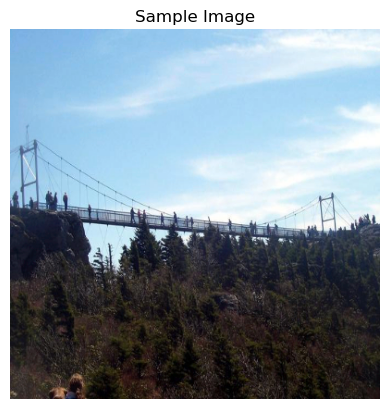

In [ ]:
X = (1.0/255)*l_array
y = (1.0/255)*ab_array

print(f"y range (a&b) max: {y.max()} min:{y.min()}")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

sample_lab = np.concatenate((X_train[0]*255, y_train[0]*255), axis=-1) # L & ab #squeez to remove batch dim


sample_rgb = cv2.cvtColor(sample_lab.astype(np.uint8), cv2.COLOR_LAB2RGB)

plt.imshow(sample_rgb)
plt.title('Sample Image')
plt.axis('off')
plt.show()

Here is another model similar to what we had going on earlier.

In [ ]:
encoder_input = Input(shape=(400, 400, 1,))
encoder_output = Conv2D(128, (3,3), activation='relu', padding='same', strides=2)(encoder_input)
encoder_output = Conv2D(256, (3,3), activation=None, padding='same', use_bias=False)(encoder_output)
encoder_output = layers.BatchNormalization()(encoder_output)
encoder_output = layers.Activation('relu')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation='relu', padding='same', strides=2)(encoder_output)

encoder_output = Conv2D(256, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same', strides=2)(encoder_output)
encoder_output = Conv2D(512, (3,3), activation=None, padding='same', use_bias=False)(encoder_output)
encoder_output = layers.BatchNormalization()(encoder_output)
encoder_output = layers.Activation('relu')(encoder_output)
encoder_output = Conv2D(512, (3,3), activation='relu', padding='same')(encoder_output)
encoder_output = Conv2D(256, (3,3), activation=None, padding='same', use_bias=False)(encoder_output)
encoder_output = layers.BatchNormalization()(encoder_output)
encoder_output = layers.Activation('relu')(encoder_output)

#Fusion
embed_input = Input(shape=(1000,))
fusion_output = RepeatVector(50 * 50)(embed_input)
fusion_output = Reshape(([50, 50, 1000]))(fusion_output)

concat = concatenate([encoder_output, fusion_output], axis=3)
fusion_output = Conv2D(512, (1, 1), activation='relu', padding='same')(concat)

fusion_output_norm = Conv2D(512, (1, 1), activation=None, padding='same', use_bias=False)(concat)
fusion_output_norm = layers.BatchNormalization()(fusion_output_norm)
fusion_output_norm = layers.Activation('relu')(fusion_output_norm)

fusion_output_mix = layers.add([fusion_output,fusion_output_norm])


x = layers.Conv2DTranspose(512, 3, activation = 'relu', padding = 'same')(fusion_output_mix)
x = layers.Conv2DTranspose(512, 3, activation = 'relu', padding = 'same', strides=2)(x)
x = layers.Conv2DTranspose(256, 3, activation = 'relu', padding = 'same')(x)
x = layers.Conv2DTranspose(128, 3, activation = 'relu', padding = 'same', strides=2)(x)
x = layers.Conv2DTranspose(64, 3, activation = 'relu', padding = 'same')(x)
x = layers.Conv2DTranspose(32, 3, activation = 'relu', padding = 'same', strides=2)(x)

decoder_output = Conv2D(2, 1, activation="linear", padding = 'same')(x)

model = Model(inputs=[encoder_input, embed_input], outputs=decoder_output)

We will preprocess the embeddings ahead of time for this model.

In [ ]:
inception = InceptionResNetV2(include_top=True)
def gray2rgb(pix):
    return np.concatenate([pix, pix, pix], axis=-1)

def create_inception_embedding(grayscale):
    three_channeled_L = gray2rgb(grayscale)
    print(f"Embeded L in 3dim rgb shape: {three_channeled_L.shape}; before going through embedding")
    grayscaled_resized = []
    for i in three_channeled_L:
        i = resize(i, (299, 299))
        grayscaled_resized.append(i)
    grayscaled_resized = np.array(grayscaled_resized)
    grayscaled_resized = preprocess_input(grayscaled_resized)
    embed = inception.predict(grayscaled_resized)
    print(f"returning embedding as {embed.shape}")
    return embed

def image_a_b_gen(x_, Y_):
    grayscale = x_
    embed = create_inception_embedding(grayscale)
    y_ = Y_
    return ([grayscale, embed], y_)

Lets preprocess our images. Create the embedding and return an object with the two inputs and the one output: X_train ready -> ((Input1: Gray, Emmbedding), (A & B))

In [ ]:
X_train_ready = image_a_b_gen(X_train, y_train)

print("X_train_ready shape:", len(X_train_ready[0]))
print("X_train_L shape:", X_train_ready[0][0].shape)
print("X_train_embed shape:", X_train_ready[0][1].shape)
print("Y_train shape:", X_train_ready[1].shape)

Embeded L in 3dim rgb shape: (2400, 400, 400, 3); before going through embedding
returning embedding as (2400, 1000)
X_train_ready shape: 2
X_train_L shape: (2400, 400, 400, 1)
X_train_embed shape: (2400, 1000)
Y_train shape: (2400, 400, 400, 2)


Yes, the following means the first 110 samples from the test data are compromised. Test data leakage. This was fixed in the version above with the dataset objects.

In [ ]:
X_val_ready = image_a_b_gen(X_test[:110], y_test[:110])

Embeded L in 3dim rgb shape: (110, 400, 400, 3); before going through embedding
returning embedding as (110, 1000)


Here is the custom callback, this one does not expect a dataset object but an X and y set.

In [ ]:
mins_n_maxs = []
class DisplayTestResults(Callback):
    def __init__(self, X_test, y_test, model):
        self.X_test = X_test
        self.y_test = y_test
        self.model = model

    def on_epoch_end(self, epoch, logs=None):
        clear_output(wait=True)
        index = np.random.randint(0, len(self.X_test)) #pick some sample
        three_channeled_L = gray2rgb(self.X_test[index])
        resised = resize( three_channeled_L, (299, 299))
        prepro = preprocess_input(resised)
        expanded =  np.expand_dims(prepro, axis=0)
        embed = inception.predict(expanded)

        x_test_sample = [np.expand_dims(self.X_test[index] , axis=0),   embed  ] # [ L , embed ]
        y_test_sample = np.expand_dims(self.y_test[index], axis=0)
        y_pred = self.model.predict(x_test_sample)

        print(f"Predicted a_max {y_pred[0,:,:,0].max().round(4)}, a_min {y_pred[0,:,:,0].min().round(4)}, a_mean {y_pred[0,:,:,0].mean().round(4)}, b_max {y_pred[0,:,:,1].max().round(4)}, b_min {y_pred[0,:,:,1].min().round(4)}, b_mean {y_pred[0,:,:,1].mean().round(4)}", flush=True)
        mins_n_maxs.append([[y_pred[0,:,:,0].max().round(4), y_pred[0,:,:,0].min().round(4), y_pred[0,:,:,0].min().round(4)],[y_pred[0,:,:,1].max().round(4), y_pred[0,:,:,1].min().round(4), y_pred[0,:,:,1].mean().round(4)]]) #Maybe to be plotted later with history.

        predicted_lab = np.concatenate((x_test_sample[0][0] *255, y_pred[0]*255), axis=-1) # L & ab #squeez to remove batch dim
        predicted_rgb = cv2.cvtColor(predicted_lab.astype(np.uint8), cv2.COLOR_LAB2RGB)


        plt.imshow(predicted_rgb) #<- when predicting a/b
        plt.title('Predicted Image')
        plt.axis('off')
        plt.show()

        img_lab = np.zeros((X_test[index].shape[0], y_test[index].shape[1], 3), dtype=np.uint8) #Needing to manipulate the shape first.
        img_lab[:, :, 0] = X_test[index, :, :, 0]*255 #L
        img_lab[:, :, 1:] = y_test[index]*255

        img_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)

        plt.imshow(img_rgb)
        plt.title('Correct Image')
        plt.axis('off')
        plt.show()

# Instantiate the custom callback
display_test_results_callback = DisplayTestResults(X_test, y_test, model)

Predicted a_max 0.5357000231742859, a_min 0.454800009727478, a_mean 0.49570000171661377, b_max 0.6003000140190125, b_min 0.34850001335144043, b_mean 0.4805999994277954


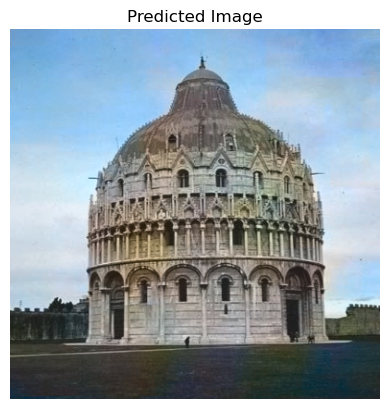

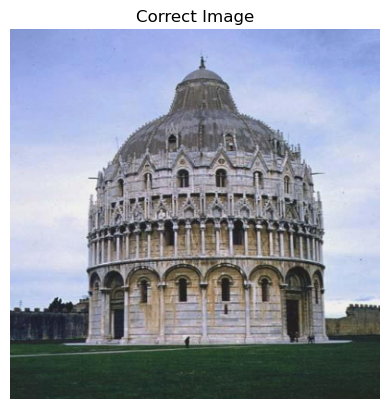

240/240 [==============================] - 69s 290ms/step - loss: 0.2075 - mae: 0.0140 - mse: 4.5456e-04 - val_loss: 0.5460 - val_mae: 0.0302 - val_mse: 0.0019 - lr: 1.0000e-04
Epoch 114/2000
 10/240 [>.............................] - ETA: 1:35 - loss: 0.1921 - mae: 0.0132 - mse: 3.7980e-04

KeyboardInterrupt: 

In [ ]:
early_stopping = EarlyStopping(patience=100, restore_best_weights=True, verbose=1)
reduce_LR = ReduceLROnPlateau(patience=50, min_lr = 0.0000001, verbose=1)
b_s = 10
epochs = 2000


initial_learning_rate = 0.001
optimizer = Adam(learning_rate=initial_learning_rate)
# optimizer = 'adam'
model.compile(optimizer=optimizer,
              loss=lab_colorization_loss,
              metrics=['mae', 'mse'])
history = model.fit(
    x=(X_train_ready[0][0], X_train_ready[0][1]),
    y=X_train_ready[1],
    validation_data=(
        (X_val_ready[0][0], X_val_ready[0][1]),
        X_val_ready[1],
    ),
    epochs=epochs,
    batch_size=b_s,
    callbacks=[early_stopping, reduce_LR, display_test_results_callback]
)

The model was taking a while to train, I manually stoped it. For this reason the history variable has not been initialized.

In [ ]:
def plot_metric(history, mins_n_maxs, metric='loss'):
    """ Plot training and test values for a metric. """

    val_metric = 'val_'+metric

    fig, ax1 = plt.subplots()

    ax1.plot(history.history[metric], label='train ' + metric, color='blue')
    ax1.plot(history.history[val_metric], label='test ' + metric, color='orange')
    ax1.set_xlabel('epoch')
    ax1.set_ylabel(metric, color='black')
    ax1.legend(loc='upper left')

    ax2 = ax1.twinx()
    ax2.plot([item[0][0] for item in mins_n_maxs], label='a_max', linestyle='dashed', color='green')
    ax2.plot([item[0][1] for item in mins_n_maxs], label='a_min', linestyle='dashed', color='red')
    ax2.plot([item[0][2] for item in mins_n_maxs], label='a_mean', linestyle='dashed', color='brown')
    ax2.plot([item[1][0] for item in mins_n_maxs], label='b_max', linestyle='dashed', color='blue')
    ax2.plot([item[1][1] for item in mins_n_maxs], label='b_min', linestyle='dashed', color='purple')
    ax2.plot([item[1][2] for item in mins_n_maxs], label='b_mean', linestyle='dashed', color='cyan')
    ax2.set_ylabel('mins_n_maxs', color='black')
    ax2.legend(loc='upper right')

    plt.title('Model ' + metric)
    plt.show()

In [ ]:
plot_metric(history, mins_n_maxs)

In [ ]:
def plot_minsnmaxs(mins_n_maxs, metric='loss'):
    """ Plot training and test values for a metric. """

    val_metric = 'val_'+metric


    plt.xlabel('epoch')

    plt.plot([item[0][0] for item in mins_n_maxs], label='a_max', linestyle='dashed', color='green')
    plt.plot([item[0][1] for item in mins_n_maxs], label='a_min', linestyle='dashed', color='red')
    plt.plot([item[0][2] for item in mins_n_maxs], label='a_mean', linestyle='dashed', color='brown')
    plt.plot([item[1][0] for item in mins_n_maxs], label='b_max', linestyle='dashed', color='blue')
    plt.plot([item[1][1] for item in mins_n_maxs], label='b_min', linestyle='dashed', color='purple')
    plt.plot([item[1][2] for item in mins_n_maxs], label='b_mean', linestyle='dashed', color='cyan')
    plt.ylabel('mins_n_maxs', color='black')
    plt.legend(loc='upper right')

    plt.title('Model ' + metric)
    plt.show()

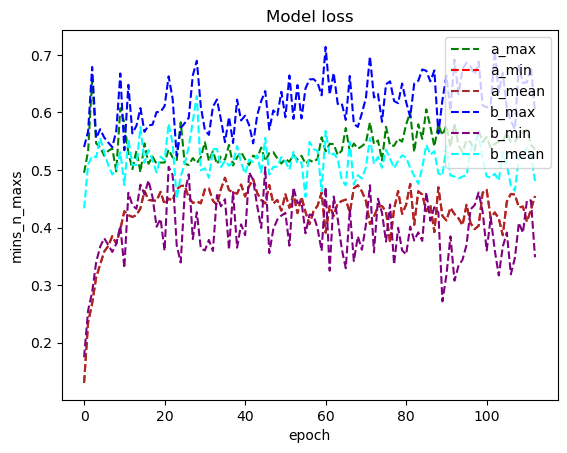

In [ ]:
plot_minsnmaxs(mins_n_maxs)

Now above we can clearly see that the color distribution of our predictions does not regroup near 0.5 or Gray photos. Like our model above. We can even notice that the color spectrum slowly gets wider and wider as the model learns.

In [ ]:
X_test_ready = image_a_b_gen(X_test[110:], y_test[110:])

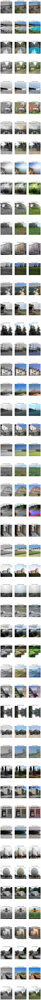

In [ ]:
amount_samples = 50

fig, axs = plt.subplots(amount_samples, 3, figsize=(10, 250))


for sample in range(amount_samples):
    # ab_sample = sample_samples[1][sample]
    # l_sample = sample_samples[0][0][sample]
    # embed_sample = sample_samples[0][1][sample]
    ab_sample = X_test_ready[1][sample]
    l_sample = X_test_ready[0][0][sample]
    embed_sample = X_test_ready[0][1][sample]

    x_sample = (np.expand_dims(l_sample, axis=0), np.expand_dims(embed_sample, axis=0))


    prediction = model.predict(x_sample)

    img_pred =  np.zeros((ab_sample.shape[0], ab_sample.shape[1], 3), dtype=np.uint8)
    img_pred[:, :, 0] = l_sample[:,:,0] *255
    img_pred[:, :, 1:] = prediction*255 #<- the magic right here
    img_rgb_pred = cv2.cvtColor(img_pred, cv2.COLOR_LAB2RGB)



    #This is used to show the true real image
    img_lab = np.zeros((ab_sample.shape[0], ab_sample.shape[1], 3), dtype=np.uint8) #Needing to manipulate the shape first.
    img_lab[:, :, 0] = l_sample[:, :, 0]*255
    img_lab[:, :, 1:] = ab_sample *255
    img_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB) #Going from original lab to rgb. This lets us see the actual image.


    axs[sample, 0].imshow(l_sample, cmap='gray')
    axs[sample, 0].set_title('Gray Scale Image')
    axs[sample, 0].axis('off')

    axs[sample, 1].imshow(img_rgb_pred)
    axs[sample, 1].set_title('Predicted Image')
    axs[sample, 1].axis('off')

    axs[sample, 2].imshow(img_rgb)
    axs[sample, 2].set_title('Correct Image')
    axs[sample, 2].axis('off')
